In [1]:
!pip install ultralytics

In [2]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import yaml
%matplotlib inline


In [3]:
root_dir = "/kaggle/input/cardetection/car/"

for root, dirs, files in os.walk(root_dir):
    level = root.replace(root_dir, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")


/
valid/
  labels/
  images/
test/
  labels/
  images/
train/
  labels/
  images/


In [4]:
yaml_path="/kaggle/input/cardetection/car/data.yaml"
with open(yaml_path,"r") as file:
    data=yaml.safe_load(file)
print(data)

{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 15, 'names': ['Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 'Speed Limit 80', 'Speed Limit 90', 'Stop'], 'roboflow': {'workspace': 'selfdriving-car-qtywx', 'project': 'self-driving-cars-lfjou', 'version': 6, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/selfdriving-car-qtywx/self-driving-cars-lfjou/dataset/6'}}


In [5]:
for idx, name in enumerate(data['names']):
    print(f"{idx}: {name}")

0: Green Light
1: Red Light
2: Speed Limit 10
3: Speed Limit 100
4: Speed Limit 110
5: Speed Limit 120
6: Speed Limit 20
7: Speed Limit 30
8: Speed Limit 40
9: Speed Limit 50
10: Speed Limit 60
11: Speed Limit 70
12: Speed Limit 80
13: Speed Limit 90
14: Stop


In [6]:
train_images_dir = "/kaggle/input/cardetection/car/train/images/"

# Get list of image files
image_files = [f for f in os.listdir(train_images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Pick 25 random images (or less if not enough)
sample_files = random.sample(image_files, min(25, len(image_files)))

plt.figure(figsize=(20,12))

for i, img_name in enumerate(sample_files, 1):
    img_path = os.path.join(train_images_dir, img_name)
    img = Image.open(img_path)
    plt.subplot(5,5,i)
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [7]:
image_files = [f for f in os.listdir(train_images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

for img_name in image_files[:5]:  # Check first 5 images
    img_path = os.path.join(train_images_dir, img_name)
    image = cv2.imread(img_path)
    if image is not None:
        h, w, c = image.shape
        print(f"Image: {img_name} - Height: {h}, Width: {w}, Channels: {c}")
    else:
        print(f"Failed to load {img_name}")

Image: 00004_00034_00011_png.rf.2828d9b90a08f69f20d4fe5a94955d6c.jpg - Height: 416, Width: 416, Channels: 3
Image: road606_png.rf.4cfc55183329cd1d9c7a9edbf038c76f.jpg - Height: 416, Width: 416, Channels: 3
Image: 00004_00059_00019_png.rf.6bd94ce764502426dead721f2ee4e40f.jpg - Height: 416, Width: 416, Channels: 3
Image: road875_png.rf.71bbad8e5a7500b8a0d189e54346149a.jpg - Height: 416, Width: 416, Channels: 3
Image: 123e596f-82d1-4baa-a6b8-65b6e2bcf736_jpg.rf.24e8dcde03f21681357f459518e1e6e6.jpg - Height: 416, Width: 416, Channels: 3


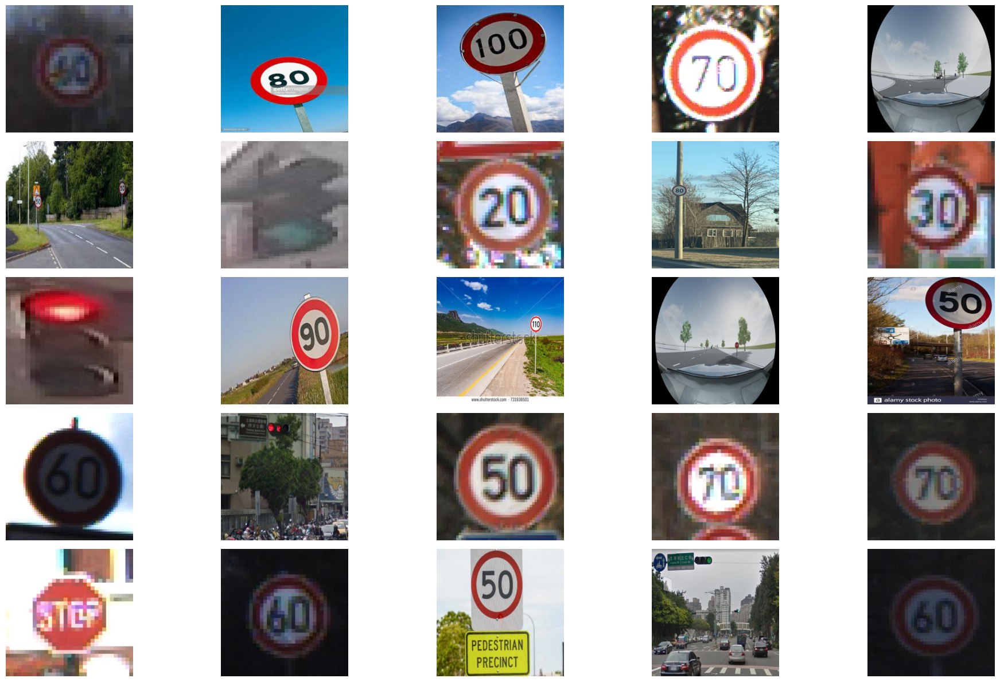

In [8]:
valid_images_dir = "/kaggle/input/cardetection/car/valid/images/"

# Get list of image files
image_files = [f for f in os.listdir(valid_images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Pick 25 random images (or less if not enough)
sample_files = random.sample(image_files, min(25, len(image_files)))

plt.figure(figsize=(20,12))

for i, img_name in enumerate(sample_files, 1):
    img_path = os.path.join(valid_images_dir, img_name)
    img = Image.open(img_path)
    plt.subplot(5,5,i)
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()

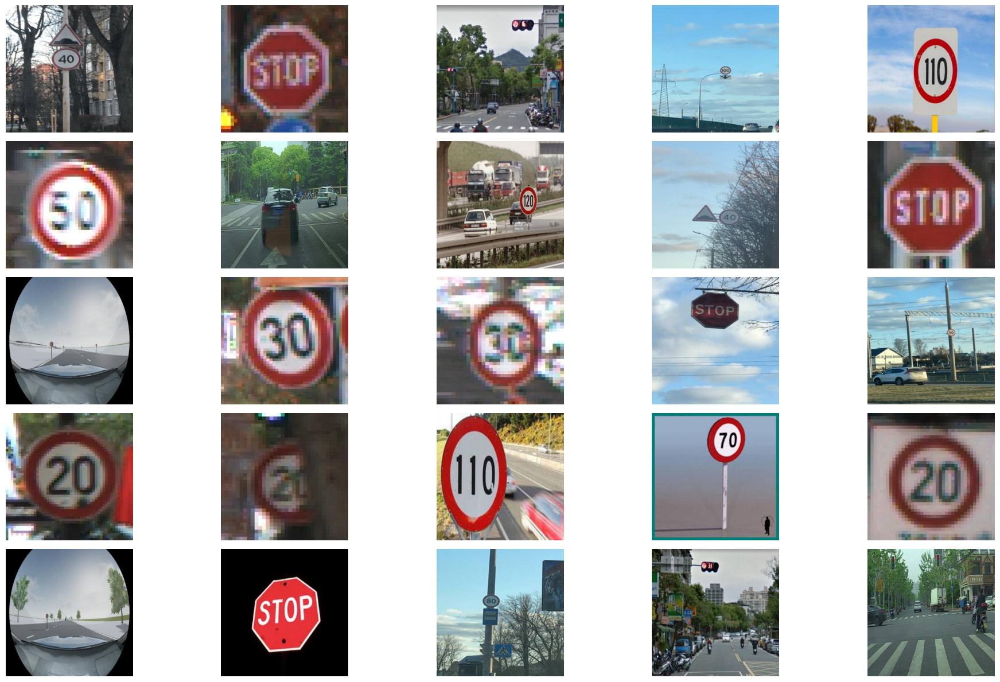

In [9]:
test_images_dir = "/kaggle/input/cardetection/car/test/images/"

# List image files
image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Sample 25 images or less if not enough
sample_files = random.sample(image_files, min(25, len(image_files)))

plt.figure(figsize=(20,12))

for i, img_name in enumerate(sample_files, 1):
    img_path = os.path.join(test_images_dir, img_name)
    img = Image.open(img_path)
    plt.subplot(5,5,i)
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()


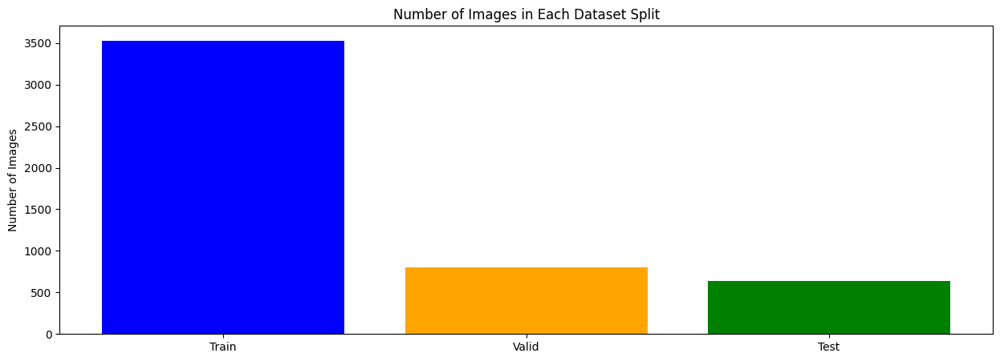

In [10]:
train_dir = "/kaggle/input/cardetection/car/train/images/"
valid_dir = "/kaggle/input/cardetection/car/valid/images/"
test_dir = "/kaggle/input/cardetection/car/test/images/"

# Count images in each folder
train_count = len([f for f in os.listdir(train_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
valid_count = len([f for f in os.listdir(valid_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
test_count = len([f for f in os.listdir(test_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Plotting
plt.figure(figsize=(15,5))
plt.bar(['Train', 'Valid', 'Test'], [train_count, valid_count, test_count], color=['blue', 'orange', 'green'])
plt.title('Number of Images in Each Dataset Split')
plt.ylabel('Number of Images')
plt.show()

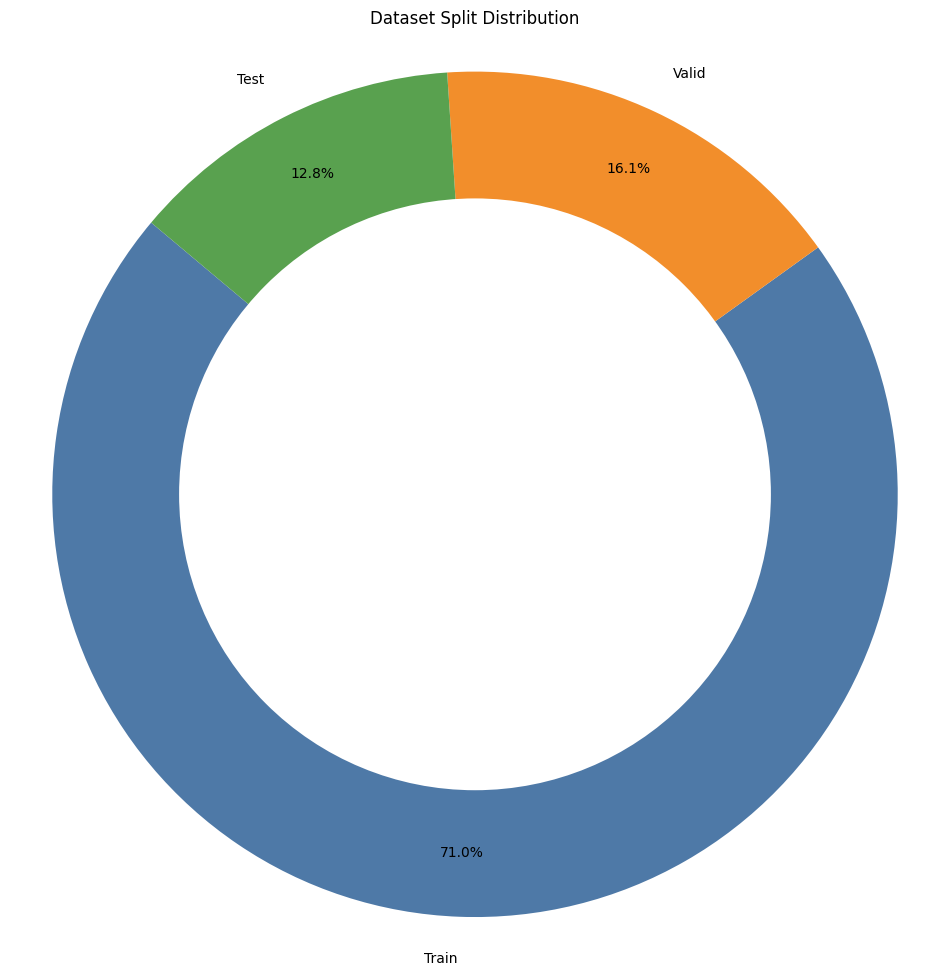

In [11]:
labels = ['Train', 'Valid', 'Test']
counts = [train_count, valid_count, test_count]
colors = ['#4e79a7', '#f28e2b', '#59a14f']

# Plot donut chart
plt.figure(figsize=(12,12))
wedges, texts, autotexts = plt.pie(counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140, pctdistance=0.85)

# Draw circle for donut shape
centre_circle = plt.Circle((0,0),0.70,fc='white')
plt.gca().add_artist(centre_circle)

plt.title('Dataset Split Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

In [12]:
model=YOLO("yolo11n.pt")

history=model.train(data=yaml_path,epochs=25,batch=-1,optimizer="auto")

New https://pypi.org/project/ultralytics/8.3.160 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.159 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/cardetection/car/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, 

train: Scanning /kaggle/input/cardetection/car/train/labels... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:03<00:00, 1031.73it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/cardetection/car/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla P100-PCIE-16GB) 15.89G total, 0.12G reserved, 0.06G allocated, 15.71G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
     2592765       6.456         0.545          39.3         136.7        (1, 3, 640, 640)                    list
     2592765       12.91         0.730         27.88         81.51        (2, 3, 640, 640)                    list
     2592765       25.82         1.135         31.23         124.2        (4, 3, 640, 640)                    list
     2592765       51.65         1.739         34.81         83.15        (8, 3, 640, 640)                    list
     2592765       103.

train: Scanning /kaggle/input/cardetection/car/train/labels... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:03<00:00, 1145.23it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/cardetection/car/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 1.8±0.9 ms, read: 26.9±15.0 MB/s, size: 19.9 KB)


val: Scanning /kaggle/input/cardetection/car/valid/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:01<00:00, 454.83it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/cardetection/car/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0004140625), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train3
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      7.01G     0.8723       3.84      1.216         62        640: 100%|██████████| 67/67 [00:36<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.80it/s]

                   all        801        944     0.0343      0.776      0.161       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      6.82G      0.755      2.704      1.101         62        640: 100%|██████████| 67/67 [00:36<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.74it/s]

                   all        801        944      0.319      0.372      0.273      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      6.91G     0.7606      2.246      1.089         73        640: 100%|██████████| 67/67 [00:36<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.60it/s]

                   all        801        944      0.351      0.525      0.397      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      6.91G     0.7362      1.895      1.079         62        640: 100%|██████████| 67/67 [00:36<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.76it/s]

                   all        801        944      0.542      0.538      0.574      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      6.93G     0.6997      1.594      1.057         65        640: 100%|██████████| 67/67 [00:36<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.72it/s]

                   all        801        944      0.669       0.59      0.662      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      6.91G     0.6706      1.359      1.043         66        640: 100%|██████████| 67/67 [00:36<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.82it/s]

                   all        801        944      0.732      0.611      0.731      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      6.93G     0.6623      1.229      1.024         64        640: 100%|██████████| 67/67 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.79it/s]

                   all        801        944       0.84      0.703       0.81      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      6.91G     0.6499      1.141      1.025         68        640: 100%|██████████| 67/67 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.83it/s]

                   all        801        944      0.808      0.663      0.767      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      6.91G     0.6382      1.064      1.021         75        640: 100%|██████████| 67/67 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.82it/s]

                   all        801        944      0.908      0.771      0.865      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      6.92G     0.6253     0.9612       1.01         69        640: 100%|██████████| 67/67 [00:35<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.70it/s]

                   all        801        944      0.895      0.777      0.873      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      6.92G     0.6139     0.9212     0.9955         70        640: 100%|██████████| 67/67 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.76it/s]

                   all        801        944      0.887      0.806      0.887      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      6.92G     0.6112     0.8833     0.9989         73        640: 100%|██████████| 67/67 [00:35<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]

                   all        801        944      0.945      0.808      0.899      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      6.82G     0.5904     0.8264     0.9926         81        640: 100%|██████████| 67/67 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.82it/s]

                   all        801        944      0.908      0.811        0.9      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      6.92G     0.5824     0.7965     0.9851         68        640: 100%|██████████| 67/67 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.69it/s]

                   all        801        944      0.923      0.797      0.887      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      6.92G     0.5736     0.7793     0.9864         69        640: 100%|██████████| 67/67 [00:35<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.80it/s]

                   all        801        944      0.927      0.839      0.913      0.772


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      7.17G     0.5748     0.6234     0.9604         35        640: 100%|██████████| 67/67 [00:38<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.84it/s]

                   all        801        944      0.919      0.819      0.912      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      6.91G     0.5692     0.5686     0.9601         42        640: 100%|██████████| 67/67 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.72it/s]

                   all        801        944      0.947      0.824      0.917      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      6.91G     0.5619     0.5323     0.9505         37        640: 100%|██████████| 67/67 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.83it/s]

                   all        801        944      0.911      0.866      0.928      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25       6.9G     0.5516     0.4982     0.9427         36        640: 100%|██████████| 67/67 [00:35<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.89it/s]

                   all        801        944      0.946      0.835      0.922      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25       6.9G     0.5383     0.4834     0.9371         38        640: 100%|██████████| 67/67 [00:35<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.91it/s]

                   all        801        944      0.932      0.874      0.937      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      6.91G     0.5302      0.455     0.9337         42        640: 100%|██████████| 67/67 [00:35<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.77it/s]

                   all        801        944      0.909      0.862      0.929      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25       6.9G     0.5194     0.4397     0.9299         47        640: 100%|██████████| 67/67 [00:35<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]

                   all        801        944      0.929      0.885       0.94      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      6.91G     0.5094     0.4238     0.9211         35        640: 100%|██████████| 67/67 [00:35<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.83it/s]

                   all        801        944      0.939      0.876      0.942      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25       6.9G     0.5035     0.4097     0.9155         37        640: 100%|██████████| 67/67 [00:35<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        801        944      0.963      0.872       0.95      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      6.93G     0.4991     0.3987      0.918         42        640: 100%|██████████| 67/67 [00:35<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.77it/s]

                   all        801        944      0.955      0.877      0.953      0.827



25 epochs completed in 0.286 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 5.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.159 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:06<00:00,  1.21it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        801        944      0.955      0.877      0.953      0.827
           Green Light         87        122      0.944      0.694      0.855      0.501
             Red Light         74        108       0.87      0.694      0.823      0.514
       Speed Limit 100         52         52      0.941      0.942      0.982      0.889
       Speed Limit 110         17         17      0.917          1      0.995      0.908
       Speed Limit 120         60         60      0.982      0.897      0.988      0.906
        Speed Limit 20         56         56          1      0.911      0.982      0.875
        Speed Limit 30         71         74      0.955      0.959       0.98      0.922
        Speed Limit 40         53         55      0.917      0.927      0.975      0.864
        Speed Limit 50         68         71      0.974      0.859      0.969      0.865
        Speed Limit 60         76         76      0.971       0.88       0.95      0.868
        Speed Limit 7

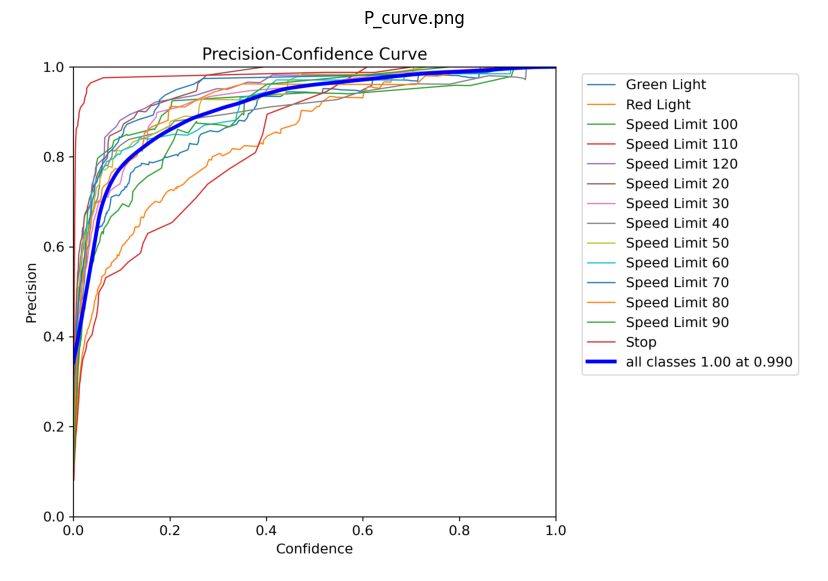

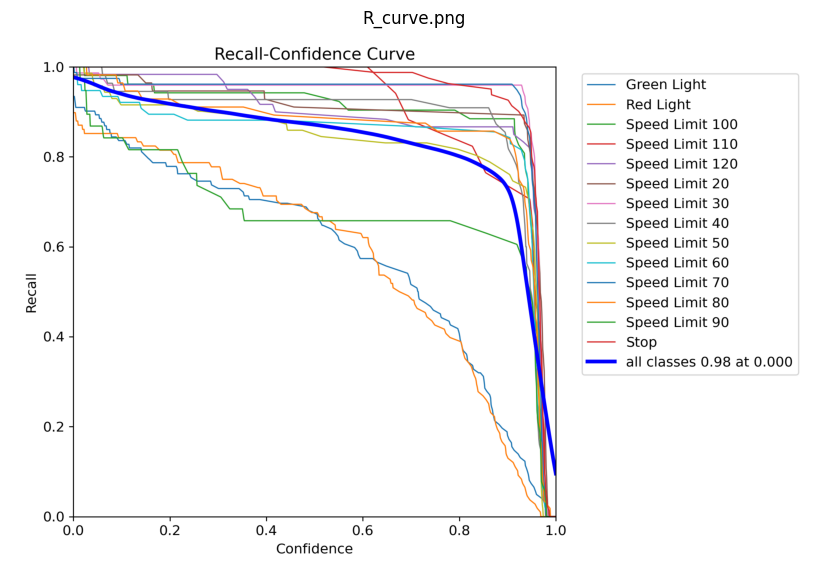

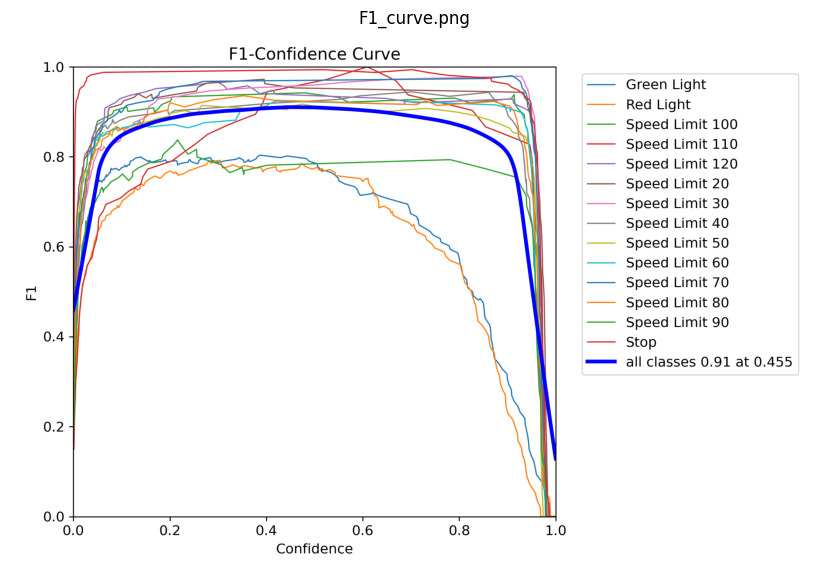

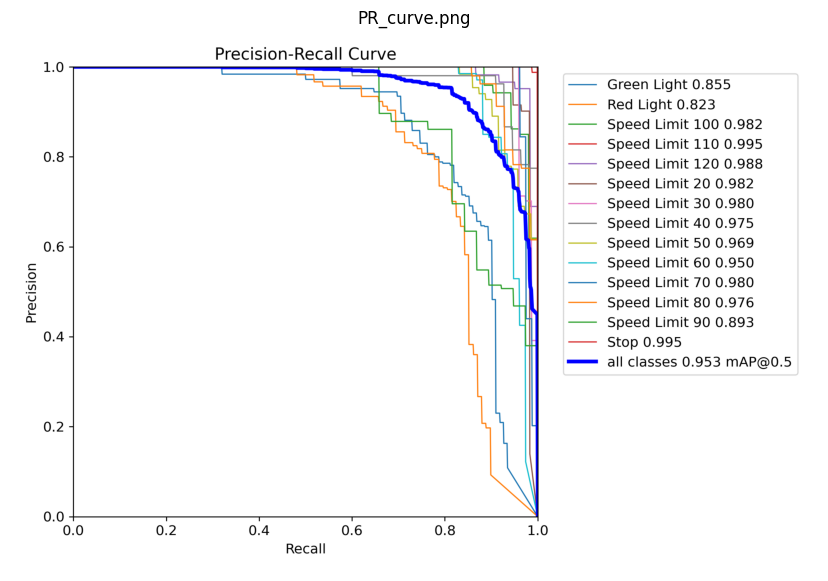

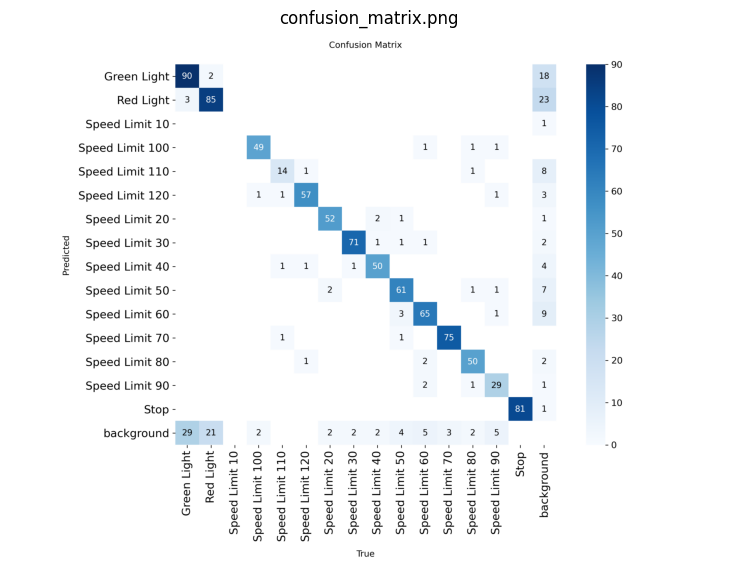

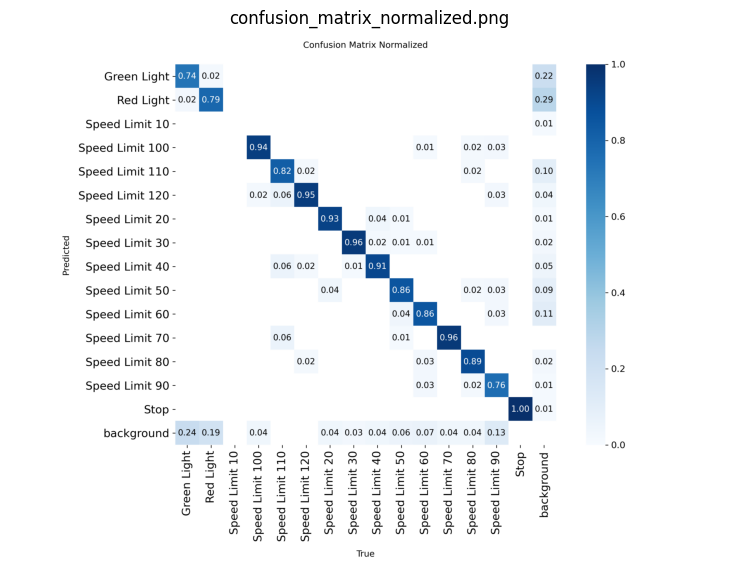

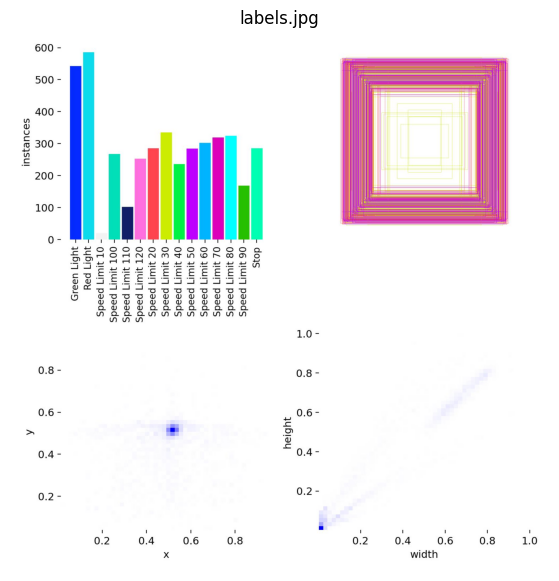

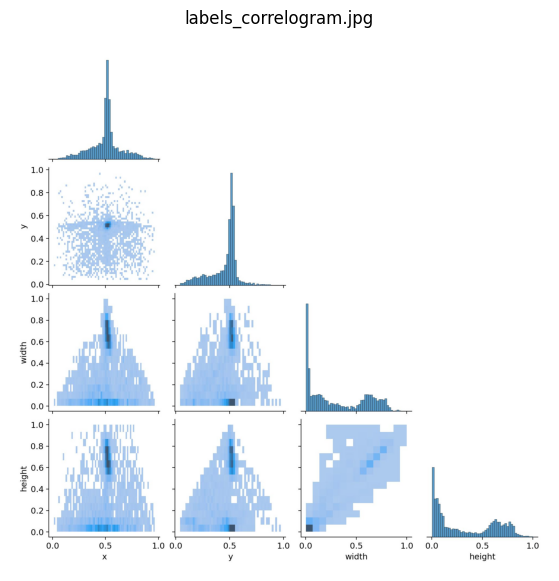

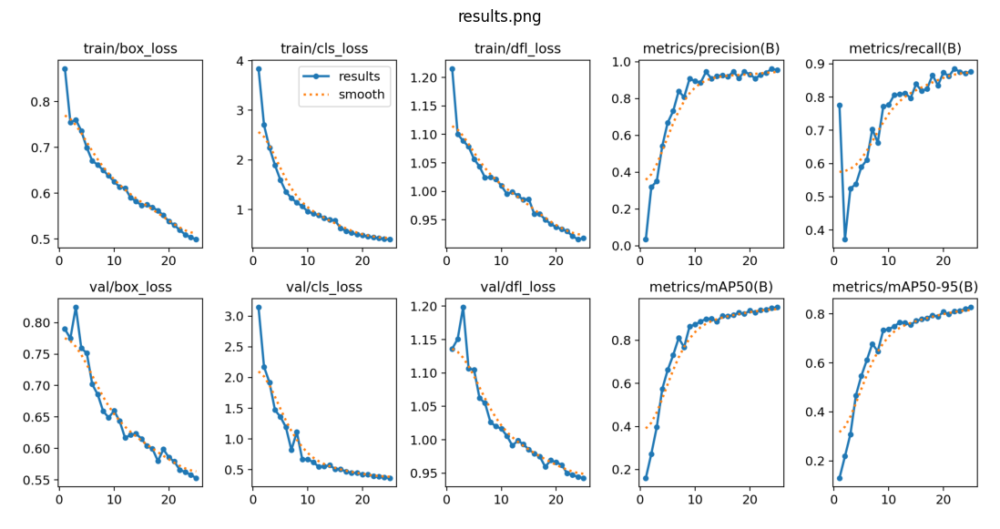

In [13]:
output_dir = "/kaggle/working/runs/detect/train"

plot_files = [
    "P_curve.png", "R_curve.png", "F1_curve.png", "PR_curve.png",
    "confusion_matrix.png", "confusion_matrix_normalized.png",
    "labels.jpg", "labels_correlogram.jpg", "results.png"
]

# Filter only existing files
existing_plots = [f for f in plot_files if os.path.exists(os.path.join(output_dir, f))]

# Show each image individually
for file in existing_plots:
    img_path = os.path.join(output_dir, file)
    img = Image.open(img_path)
    plt.figure(figsize=(15, 7))
    plt.imshow(img)
    plt.title(file)
    plt.axis('off')
    plt.show()

In [14]:
model_result=pd.read_csv("/kaggle/working/runs/detect/train/results.csv")

In [15]:
model_result.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,42.1351,0.87230,3.83960,1.21566,0.03428,0.77594,0.16065,0.13005,0.78978,3.14460,1.13612,0.000173,0.000173,0.000173
1,2,83.2913,0.75503,2.70395,1.10052,0.31892,0.37180,0.27275,0.21895,0.77499,2.17571,1.15087,0.000334,0.000334,0.000334
2,3,124.8020,0.76060,2.24562,1.08875,0.35079,0.52510,0.39651,0.30882,0.82453,1.92063,1.19832,0.000482,0.000482,0.000482
3,4,166.3710,0.73621,1.89529,1.07854,0.54174,0.53819,0.57403,0.46753,0.75935,1.47208,1.10654,0.000464,0.000464,0.000464
4,5,207.5040,0.69972,1.59402,1.05661,0.66940,0.58980,0.66205,0.54725,0.75158,1.36020,1.10473,0.000443,0.000443,0.000443


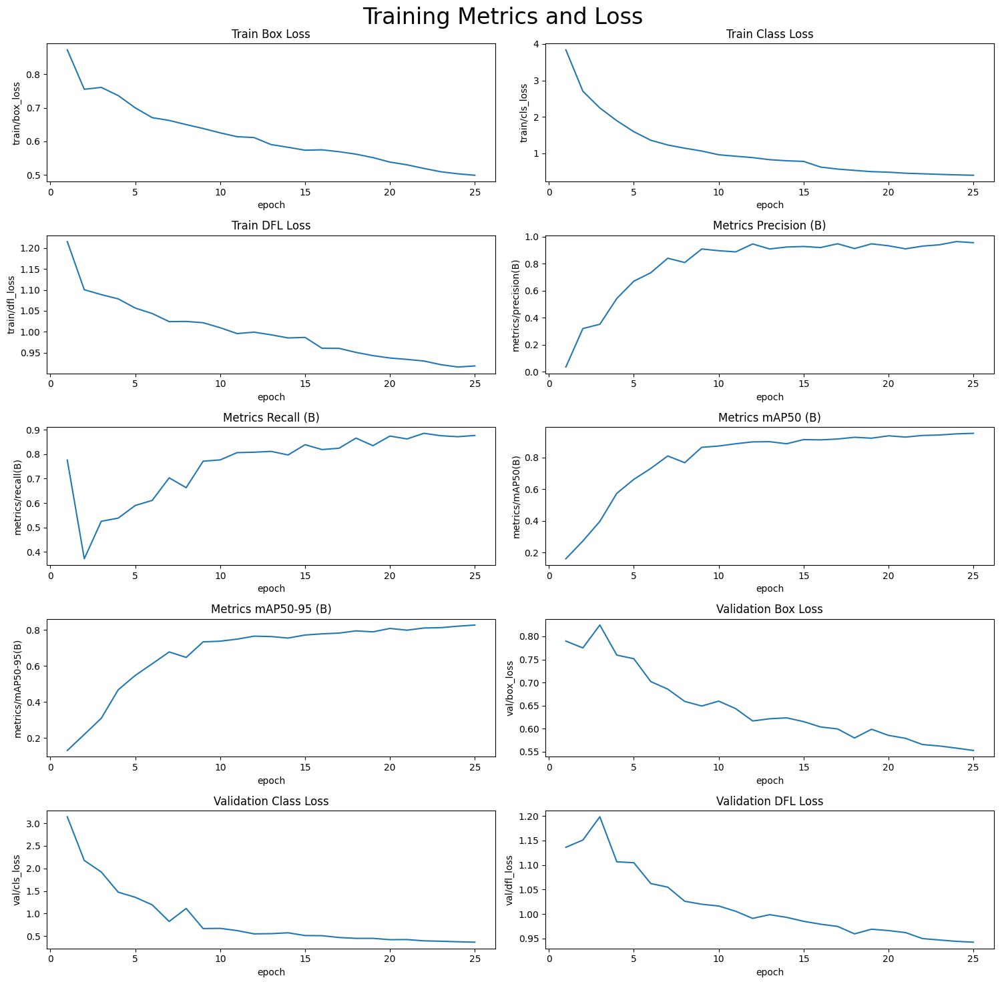

In [16]:
model_result.columns = model_result.columns.str.strip()

fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=model_result, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=model_result, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=model_result, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=model_result, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=model_result, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=model_result, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=model_result, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=model_result, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=model_result, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

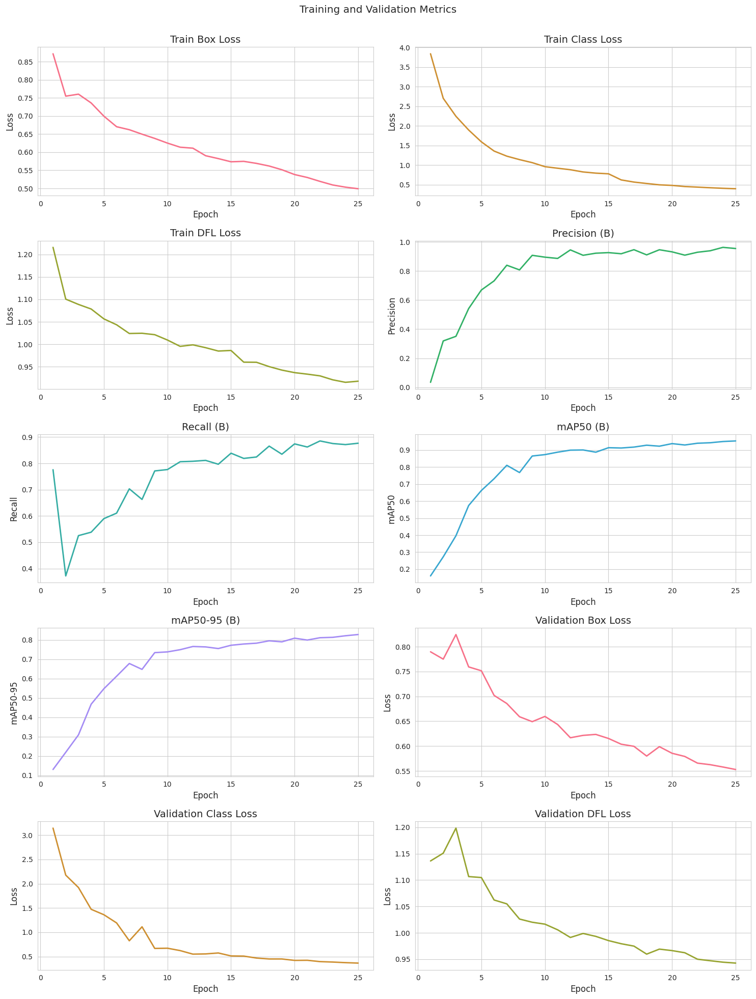

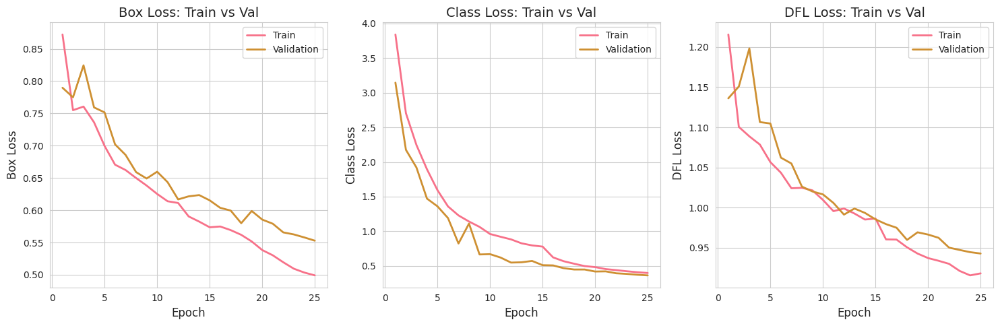

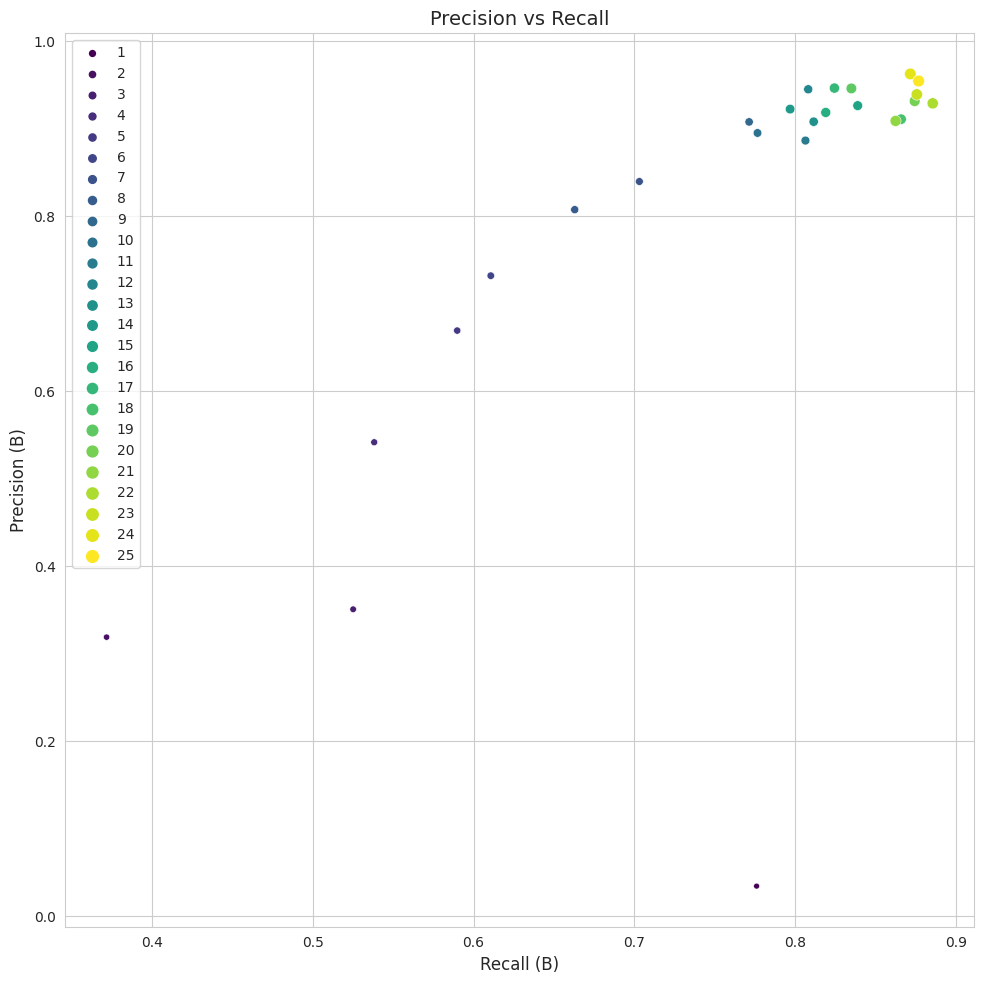

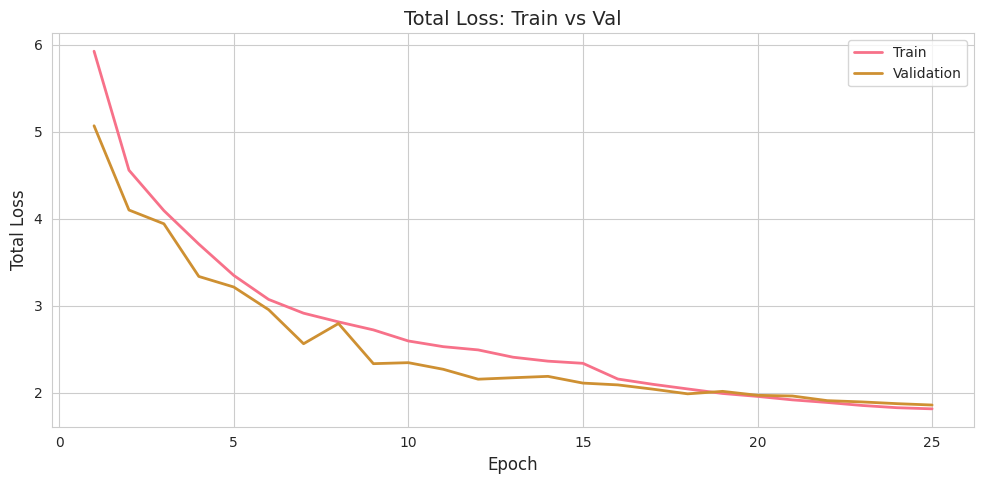

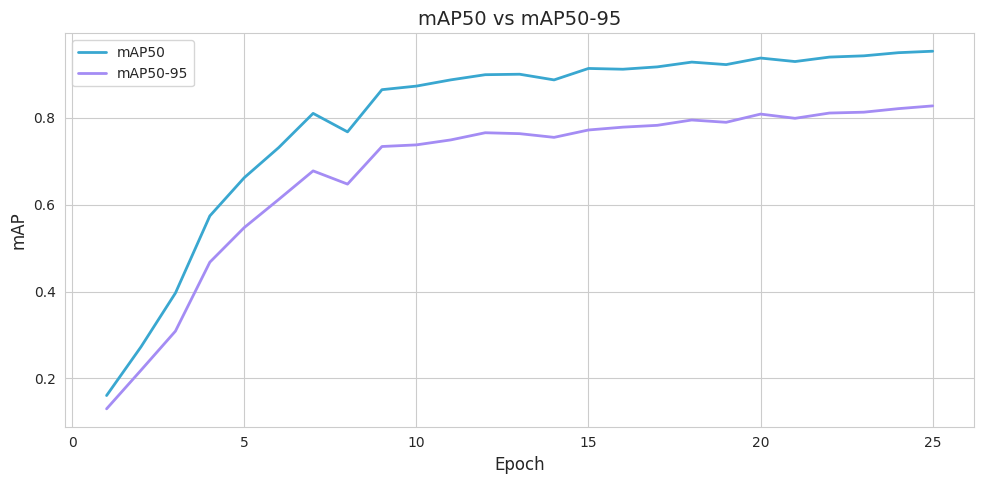

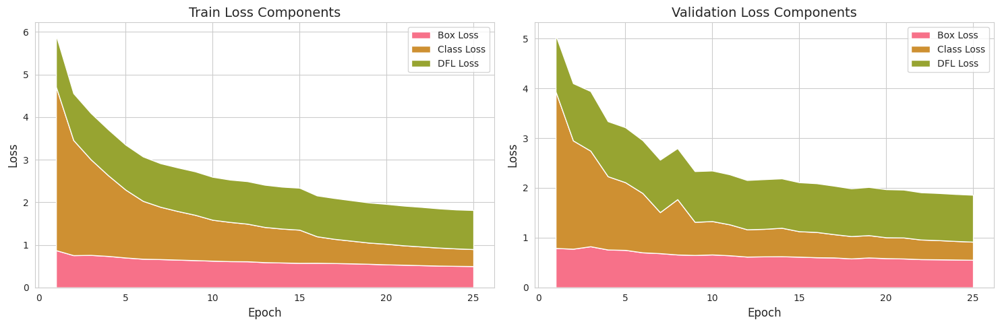

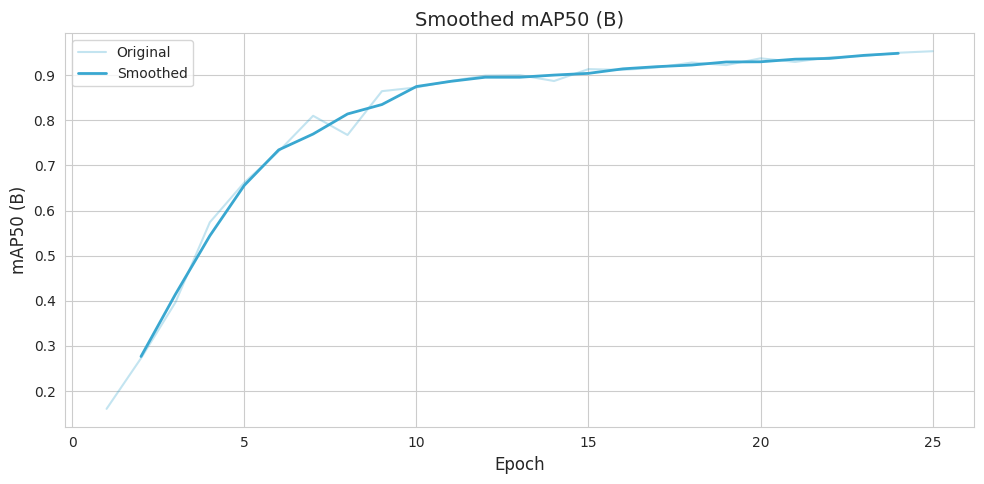

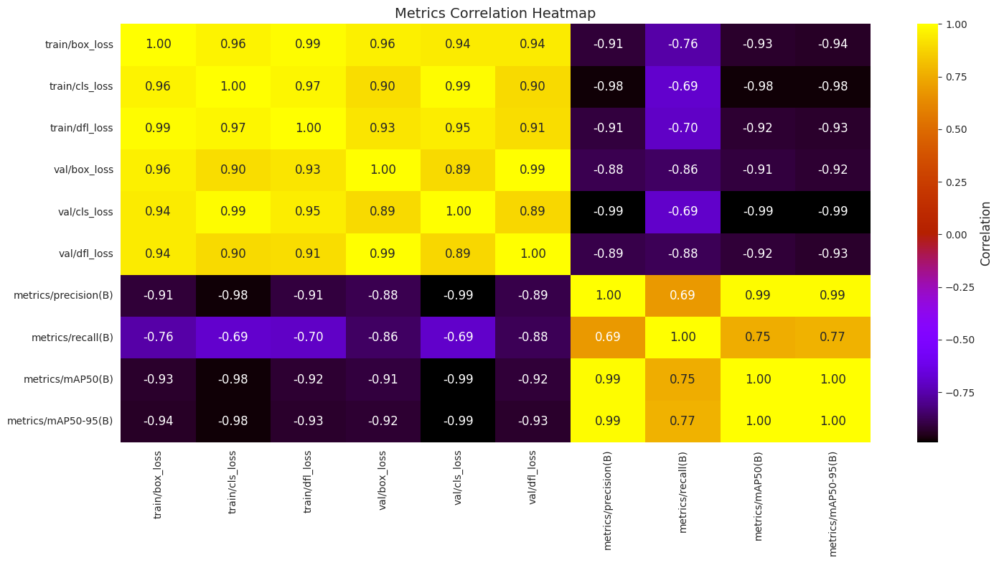

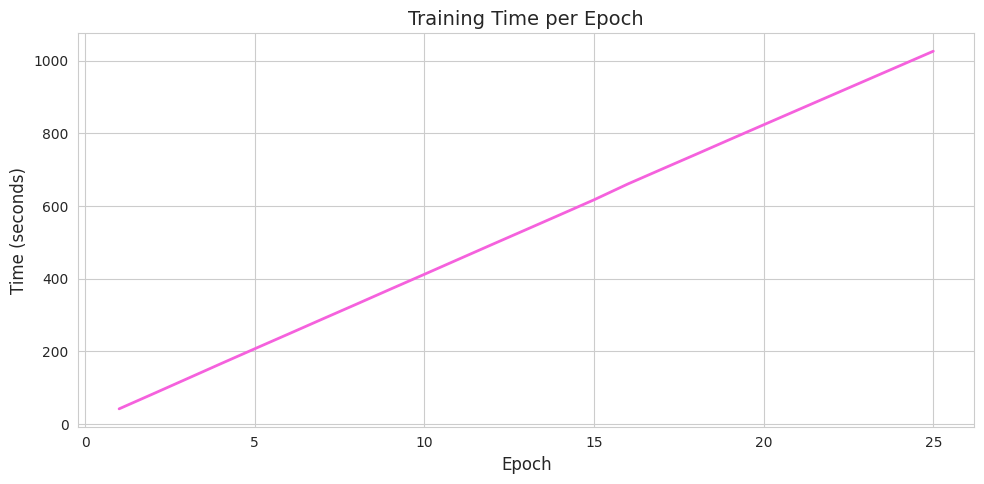

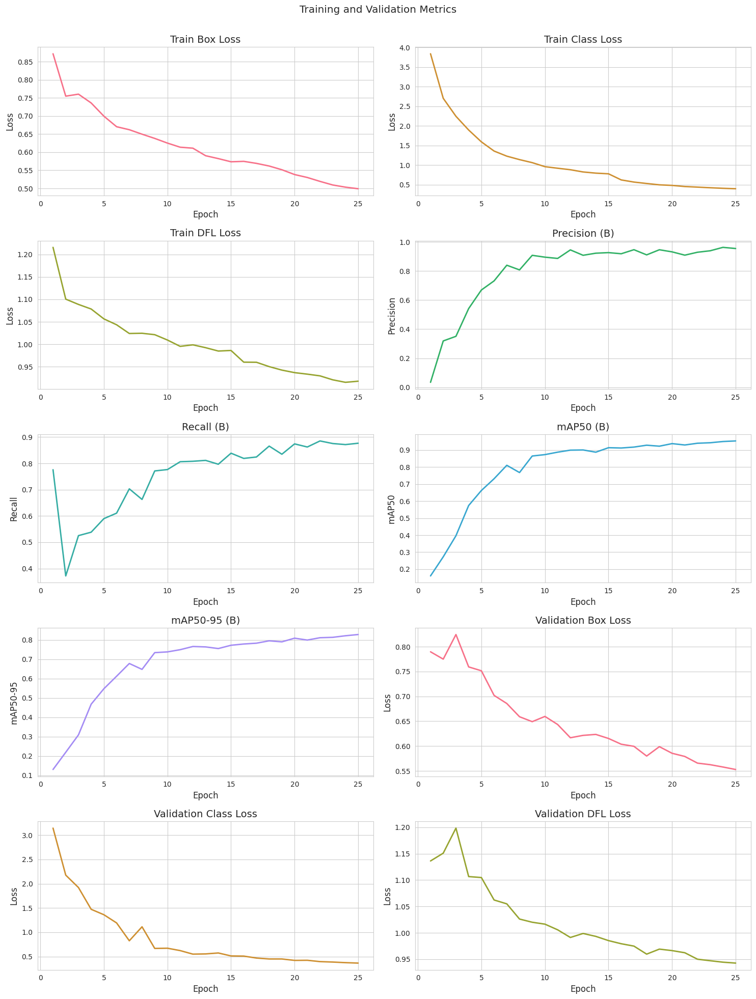

In [17]:
# Set Seaborn style for better aesthetics
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

# Define a color palette for consistency
colors = sns.color_palette("husl", 8)

# Strip whitespace from column names (just in case)
model_result.columns = model_result.columns.str.strip()

# Create figure with subplots for original plots (5 rows, 2 columns)
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 20), dpi=100)

# Original plots
sns.lineplot(x='epoch', y='train/box_loss', data=model_result, ax=axs[0, 0], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='train/cls_loss', data=model_result, ax=axs[0, 1], color=colors[1], linewidth=2)
sns.lineplot(x='epoch', y='train/dfl_loss', data=model_result, ax=axs[1, 0], color=colors[2], linewidth=2)
sns.lineplot(x='epoch', y='metrics/precision(B)', data=model_result, ax=axs[1, 1], color=colors[3], linewidth=2)
sns.lineplot(x='epoch', y='metrics/recall(B)', data=model_result, ax=axs[2, 0], color=colors[4], linewidth=2)
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result, ax=axs[2, 1], color=colors[5], linewidth=2)
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=model_result, ax=axs[3, 0], color=colors[6], linewidth=2)
sns.lineplot(x='epoch', y='val/box_loss', data=model_result, ax=axs[3, 1], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/cls_loss', data=model_result, ax=axs[4, 0], color=colors[1], linewidth=2)
sns.lineplot(x='epoch', y='val/dfl_loss', data=model_result, ax=axs[4, 1], color=colors[2], linewidth=2)

# Set titles and labels
axs[0, 0].set(title='Train Box Loss', xlabel='Epoch', ylabel='Loss')
axs[0, 1].set(title='Train Class Loss', xlabel='Epoch', ylabel='Loss')
axs[1, 0].set(title='Train DFL Loss', xlabel='Epoch', ylabel='Loss')
axs[1, 1].set(title='Precision (B)', xlabel='Epoch', ylabel='Precision')
axs[2, 0].set(title='Recall (B)', xlabel='Epoch', ylabel='Recall')
axs[2, 1].set(title='mAP50 (B)', xlabel='Epoch', ylabel='mAP50')
axs[3, 0].set(title='mAP50-95 (B)', xlabel='Epoch', ylabel='mAP50-95')
axs[3, 1].set(title='Validation Box Loss', xlabel='Epoch', ylabel='Loss')
axs[4, 0].set(title='Validation Class Loss', xlabel='Epoch', ylabel='Loss')
axs[4, 1].set(title='Validation DFL Loss', xlabel='Epoch', ylabel='Loss')

# Main title and layout
plt.suptitle('Training and Validation Metrics\n\n')
plt.tight_layout()

# Additional Plots
# 1. Train vs Validation Loss Comparison
fig_comp, axs_comp = plt.subplots(1, 3, figsize=(15, 5), dpi=100)
sns.lineplot(x='epoch', y='train/box_loss', data=model_result, label='Train', ax=axs_comp[0], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/box_loss', data=model_result, label='Validation', ax=axs_comp[0], color=colors[1], linewidth=2)
axs_comp[0].set(title='Box Loss: Train vs Val', xlabel='Epoch', ylabel='Box Loss')
axs_comp[0].legend()

sns.lineplot(x='epoch', y='train/cls_loss', data=model_result, label='Train', ax=axs_comp[1], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/cls_loss', data=model_result, label='Validation', ax=axs_comp[1], color=colors[1], linewidth=2)
axs_comp[1].set(title='Class Loss: Train vs Val', xlabel='Epoch', ylabel='Class Loss')
axs_comp[1].legend()

sns.lineplot(x='epoch', y='train/dfl_loss', data=model_result, label='Train', ax=axs_comp[2], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/dfl_loss', data=model_result, label='Validation', ax=axs_comp[2], color=colors[1], linewidth=2)
axs_comp[2].set(title='DFL Loss: Train vs Val', xlabel='Epoch', ylabel='DFL Loss')
axs_comp[2].legend()

plt.tight_layout()
plt.show()

# 2. Precision vs Recall Scatter Plot
fig_pr, ax_pr = plt.subplots(figsize=(10, 10), dpi=100)
sns.scatterplot(x='metrics/recall(B)', y='metrics/precision(B)', hue='epoch', size='epoch',palette='viridis', data=model_result, ax=ax_pr, legend='full')
ax_pr.set(title='Precision vs Recall', xlabel='Recall (B)', ylabel='Precision (B)')
plt.legend(loc="best")
plt.tight_layout()
plt.show()

# 3. Total Loss
model_result['train/total_loss'] = model_result['train/box_loss'] + model_result['train/cls_loss'] + model_result['train/dfl_loss']
model_result['val/total_loss'] = model_result['val/box_loss'] + model_result['val/cls_loss'] + model_result['val/dfl_loss']

fig_total, ax_total = plt.subplots(figsize=(10, 5), dpi=100)
sns.lineplot(x='epoch', y='train/total_loss', data=model_result, label='Train', ax=ax_total, color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/total_loss', data=model_result, label='Validation', ax=ax_total, color=colors[1], linewidth=2)
ax_total.set(title='Total Loss: Train vs Val', xlabel='Epoch', ylabel='Total Loss')
ax_total.legend()
plt.tight_layout()
plt.show()

# 4. mAP50 vs mAP50-95
fig_map, ax_map = plt.subplots(figsize=(10, 5), dpi=100)
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result, label='mAP50', ax=ax_map, color=colors[5], linewidth=2)
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=model_result, label='mAP50-95', ax=ax_map, color=colors[6], linewidth=2)
ax_map.set(title='mAP50 vs mAP50-95', xlabel='Epoch', ylabel='mAP')
ax_map.legend()
plt.tight_layout()
plt.show()

# 5. Loss Components Contribution (Stacked Area Plot)
fig_stack, axs_stack = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
axs_stack[0].stackplot(model_result['epoch'],
                       model_result['train/box_loss'],
                       model_result['train/cls_loss'],
                       model_result['train/dfl_loss'],
                       labels=['Box Loss', 'Class Loss', 'DFL Loss'],
                       colors=colors[:3])
axs_stack[0].set(title='Train Loss Components', xlabel='Epoch', ylabel='Loss')
axs_stack[0].legend(loc='upper right')

axs_stack[1].stackplot(model_result['epoch'],
                       model_result['val/box_loss'],
                       model_result['val/cls_loss'],
                       model_result['val/dfl_loss'],
                       labels=['Box Loss', 'Class Loss', 'DFL Loss'],
                       colors=colors[:3])
axs_stack[1].set(title='Validation Loss Components', xlabel='Epoch', ylabel='Loss')
axs_stack[1].legend(loc='upper right')
plt.tight_layout()
plt.show()

# 6. Smoothed Metrics (e.g., mAP50)
model_result_smoothed = model_result.rolling(window=3, center=True).mean()
fig_smooth, ax_smooth = plt.subplots(figsize=(10, 5), dpi=100)
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result, label='Original', alpha=0.3, ax=ax_smooth, color=colors[5])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result_smoothed, label='Smoothed', ax=ax_smooth, color=colors[5], linewidth=2)
ax_smooth.set(title='Smoothed mAP50 (B)', xlabel='Epoch', ylabel='mAP50 (B)')
ax_smooth.legend()
plt.tight_layout()
plt.show()

# 7. Metrics Correlation Heatmap
metrics_cols = ['train/box_loss', 'train/cls_loss', 'train/dfl_loss', 
                'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 
                'metrics/precision(B)', 'metrics/recall(B)', 
                'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
correlation_matrix = model_result[metrics_cols].corr()

fig_corr, ax_corr = plt.subplots(figsize=(15, 8), dpi=100)
sns.heatmap(correlation_matrix, annot=True, cmap='gnuplot', fmt='.2f', ax=ax_corr, cbar_kws={'label': 'Correlation'})
ax_corr.set(title='Metrics Correlation Heatmap')
plt.tight_layout()
plt.show()

# 8. Training Time Plot (using 'time' column)
fig_time, ax_time = plt.subplots(figsize=(10, 5), dpi=100)
sns.lineplot(x='epoch', y='time', data=model_result, ax=ax_time, color=colors[7], linewidth=2)
ax_time.set(title='Training Time per Epoch', xlabel='Epoch', ylabel='Time (seconds)')
plt.tight_layout()
plt.show()

# Display the original plot
plt.figure(fig)
plt.show()

# Print all metrics

In [18]:
best_model="/kaggle/working/runs/detect/train/weights/best.pt"
test_model=YOLO(best_model)
metrics=test_model.val(split="test")


for metric_name, value in metrics.results_dict.items():
    print(f"{metric_name}: {value}")


Ultralytics 8.3.159 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.8±0.7 ms, read: 30.5±8.5 MB/s, size: 16.4 KB)


val: Scanning /kaggle/input/cardetection/car/test/labels... 638 images, 1 backgrounds, 0 corrupt: 100%|██████████| 638/638 [00:00<00:00, 677.06it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/cardetection/car/test is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:05<00:00,  7.53it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        638        770      0.879      0.882      0.919      0.795
           Green Light         77        110      0.876      0.836      0.891      0.555
             Red Light         71         94      0.747      0.745      0.744      0.473
        Speed Limit 10          2          3      0.899      0.667      0.705      0.574
       Speed Limit 100         45         46      0.921      0.913      0.975      0.861
       Speed Limit 110         21         21        0.9      0.857        0.9      0.841
       Speed Limit 120         40         44      0.935      0.976      0.978      0.876
        Speed Limit 20         46         46      0.955      0.933      0.972      0.895
        Speed Limit 30         60         60      0.876       0.85      0.939      0.863
        Speed Limit 40         51         53      0.831      0.962      0.982      0.867
        Speed Limit 50         47         50      0.801       0.88      0.926      0.838
        Speed Limit 6

In [24]:

def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

test_images_path = '/kaggle/input/cardetection/car/test/images'
image_files = [f for f in os.listdir(test_images_path) if f.lower().endswith('.jpg')]

step = max(1, len(image_files) // 49)
selected_images = image_files[::step][:49]

fig, axes = plt.subplots(7, 7, figsize=(24, 24))
fig.suptitle('Test Set Predictions (7x7 Grid)', fontsize=24)

for ax, img_name in zip(axes.flatten(), selected_images):
    img_path = os.path.join(test_images_path, img_name)
    img = cv2.imread(img_path)
    if img is not None:
        img_resized = resize_image(img)
        results = test_model.predict(source=img_resized, imgsz=640, conf=0.5)
        annotated = results[0].plot(line_width=1)
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_rgb)
    else:
        ax.text(0.5, 0.5, 'Load failed', ha='center', va='center')
    ax.axis('off')

plt.tight_layout()
plt.show()



0: 640x640 1 Speed Limit 50, 1 Speed Limit 80, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 60, 8.6ms
Speed: 2.1ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Stop, 8.1ms
Speed: 1.9ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 8.3ms
Speed: 2.1ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 50, 9.9ms
Speed: 2.1ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Stop, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 90, 9.0ms
Speed: 2.1ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 70, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inferenc

In [25]:
from IPython.display import HTML, display
from base64 import b64encode
import os
import subprocess
import glob


input_path = '/kaggle/input/cardetection/video.mp4'
output_path = '/kaggle/working/result_1.mp4'

os.system(f"ffmpeg -i {input_path} -vcodec libx264 -crf 23 -preset fast {output_path}")

# Embed video in notebook
with open(output_path, 'rb') as f:
    video_data = f.read()
data_url = "data:video/mp4;base64," + b64encode(video_data).decode()

HTML(f"""
<video width=1500 height= 600 controls>
  <source src="{data_url}" type="video/mp4">
  Your browser does not support the video tag.
</video>
""")


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

# Save Model

In [26]:
# Load your trained model
best_model_path = "/kaggle/working/runs/detect/train/weights/best.pt"
model = YOLO(best_model_path)

model.export(format="onnx")  


Ultralytics 8.3.159 🚀 Python-3.11.11 torch-2.6.0+cu124 CPU (Intel Xeon 2.00GHz)
YOLO11n summary (fused): 100 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from '/kaggle/working/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 19, 8400) (5.2 MB)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.58...
ONNX: export success ✅ 1.8s, saved as '/kaggle/working/runs/detect/train/weights/best.onnx' (10.1 MB)

Export complete (2.2s)
Results saved to /kaggle/working/runs/detect/train/weights
Predict:         yolo predict task=detect model=/kaggle/working/runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=/kaggle/working/runs/detect/train/weights/best.onnx imgsz=640 data=/kaggle/input/cardetection/car/data.yaml  
Visualize:       https://netron.app


'/kaggle/working/runs/detect/train/weights/best.onnx'

In [27]:
# Input video path
input_video = "/kaggle/working/result_1.mp4"

# Run prediction
results = test_model.predict(source=input_video,save=True,conf=0.3,show_labels=True,show_conf=True,show_boxes=True)

# Look for .mp4 or .avi outputs
save_dir = results[0].save_dir
output_videos = glob.glob(os.path.join(save_dir, "*.mp4")) + glob.glob(os.path.join(save_dir, "*.avi"))

if output_videos:
    output_video = output_videos[0]
else:
    raise FileNotFoundError("❌ No output video (.mp4 or .avi) found after prediction.")

# Compress video for display
compressed_path = "/kaggle/working/compressed_output.mp4"
subprocess.run(["ffmpeg", "-y", "-i", output_video,"-c:v", "libx264", "-c:a", "aac","-preset", "fast", "-crf", "23",
                compressed_path], check=True)

# Display video
with open(compressed_path, "rb") as f:
    mp4 = f.read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

display(HTML(f"""
<video width="1500" height="800" controls>
  <source src="{data_url}" type="video/mp4">
</video>
"""))



WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/508) /kaggle/working/result_1.mp4: 640x640 1 Stop, 11.2ms
video 1/1 (frame 2/508) /kaggle/working/result_1.mp4: 640x640 1 Stop, 7.8ms
video 1/1 (frame 3/508) /kaggle/working/result_1.mp4: 640x640 1 Stop, 8.0ms
video 1/1 (frame 4/508) /kaggle/working/result_1.mp4: 640x640 (no detections), 7.6ms
video 1/1 (frame 5/508) /kaggle/working/result_1.mp4: 640x640 1 Stop, 8.0ms
video 1/1 (frame 6/508) /kaggle/working/result_1.mp4: 640x640 1 St

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [28]:
! pip freeze 

absl-py==1.4.0
accelerate==1.5.2
aiofiles==22.1.0
aiohappyeyeballs==2.6.1
aiohttp==3.11.18
aiosignal==1.3.2
aiosqlite==0.21.0
alabaster==1.0.0
albucore==0.0.23
albumentations==2.0.5
ale-py==0.10.2
alembic==1.15.2
altair==5.5.0
annotated-types==0.7.0
annoy==1.17.3
ansicolors==1.1.8
antlr4-python3-runtime==4.9.3
anyio==4.9.0
argon2-cffi==23.1.0
argon2-cffi-bindings==21.2.0
args==0.1.0
array_record==0.7.1
arrow==1.3.0
arviz==0.21.0
astropy==7.0.1
astropy-iers-data==0.2025.3.31.0.36.18
asttokens==3.0.0
astunparse==1.6.3
atpublic==5.1
attrs==25.3.0
audioread==3.0.1
autograd==1.7.0
babel==2.17.0
backcall==0.2.0
bayesian-optimization==2.0.3
beartype==0.20.2
beautifulsoup4==4.13.3
betterproto==2.0.0b6
bigframes==1.42.0
bigquery-magics==0.9.0
bleach==6.2.0
blinker==1.9.0
blis==1.2.1
blobfile==3.0.0
blosc2==3.2.1
bokeh==3.6.3
Boruta==0.4.3
boto3==1.38.11
botocore==1.38.11
Bottleneck==1.4.2
-e git+https://github.com/SohierDane/BigQuery_Helper@8615a7f6c1663e7f2d48aa2b32c2dbcb600a440f#egg=bq_helper